In [1]:
import vectorbt as vbt
import numpy as np
import pandas as pd
import pytz
from datetime import datetime, timedelta
from pprint import pprint
import warnings
warnings.filterwarnings('ignore')

# Parâmetros

In [2]:
seed = 42
simbolo = 'BTC-USD'
metrica = 'total_return'

data_inicio = datetime(2017, 1, 1, 0, 0, 0)
data_fim = datetime(2022, 8, 10, 23, 59, 59)
data_inicio = pytz.timezone('utc').localize(data_inicio)
data_fim = pytz.timezone('utc').localize(data_fim)

delta = 100

qtd_splits=20
tamanho_treinamento=365 # tamanho do conjunto utilizado para fazer a seleção das médias
tamanho_validacao=180 # tamanho dos subconjuntos para validação

freq='1d'

vbt.settings.portfolio['init_cash'] = 1000.0
vbt.settings.portfolio['fees'] = 0.001  # 0.1%
vbt.settings.portfolio['slippage'] = 0.0
vbt.settings.portfolio['freq'] = freq

direction='longonly' # opções: longonly, shortonly, both

# Dados

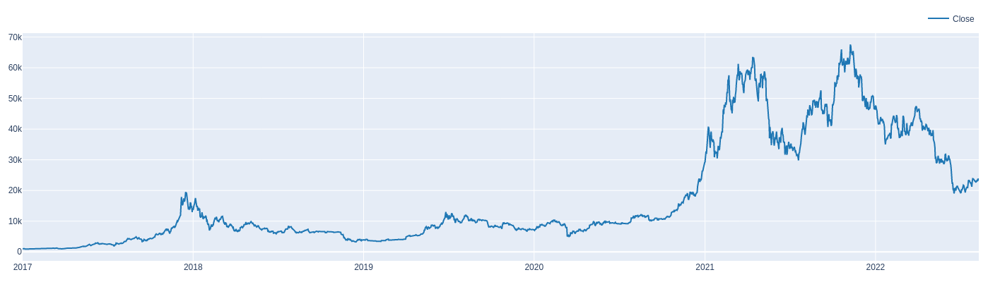

In [3]:
time_buffer = timedelta(days=delta) 
precos_buf = vbt.YFData.download(simbolo, start=data_inicio-time_buffer, end=data_fim, interval=freq, missing_index='drop').get('Close')
precos_buf = precos_buf.astype(np.float64)
  
precos = precos_buf[data_inicio:data_fim]
precos.vbt.plot(width=1000, height=400).show()

In [4]:
precos_buf

Date
2016-09-23 00:00:00+00:00      602.841980
2016-09-24 00:00:00+00:00      602.625000
2016-09-25 00:00:00+00:00      600.825989
2016-09-26 00:00:00+00:00      608.043030
2016-09-27 00:00:00+00:00      606.166016
                                 ...     
2022-08-06 00:00:00+00:00    22961.279297
2022-08-07 00:00:00+00:00    23175.890625
2022-08-08 00:00:00+00:00    23809.486328
2022-08-09 00:00:00+00:00    23164.318359
2022-08-10 00:00:00+00:00    23947.642578
Freq: D, Name: Close, Length: 2148, dtype: float64

# Separação dos dados para simulação

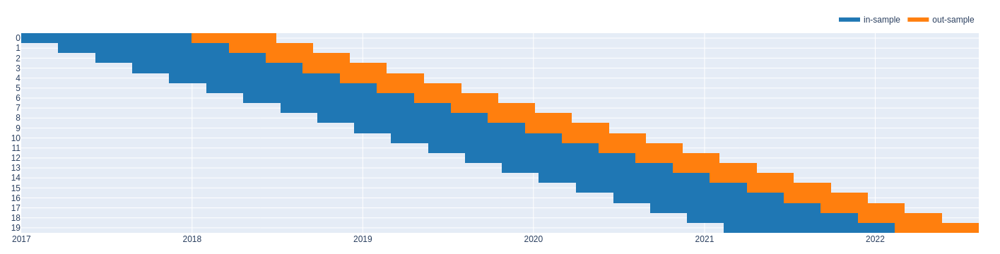

In [5]:
split_kwargs = dict(
    n=qtd_splits,
    window_len=tamanho_treinamento + tamanho_validacao + delta, # primeiros dias(delta) serão descartados
    left_to_right=False
)
split_kwargs_plot = dict(
    n=qtd_splits,
    window_len=tamanho_treinamento + tamanho_validacao, # primeiros dias(delta) serão descartados
    set_lens=(tamanho_validacao,),
    left_to_right=False
)

precos.vbt.rolling_split(**split_kwargs_plot, plot=True, trace_names=['in-sample', 'out-sample']).show()
(splits_precos, splits_indices) = precos_buf.vbt.rolling_split(**split_kwargs )

In [6]:
splits_precos

split_idx,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,602.841980,769.731018,1179.969971,1888.650024,3252.909912,5526.640137,13405.799805,6973.529785,6734.819824,6792.830078,4347.109863,3690.188232,5350.726562,10666.482422,8151.500488,7322.532227,4970.788086,9700.414062,12254.402344,14133.707031
1,602.625000,780.086975,1222.500000,1987.709961,3213.939941,5750.799805,13980.599609,6844.229980,6769.939941,6529.169922,3880.760010,3648.430664,5402.697266,10530.732422,7988.155762,7275.155762,5563.707031,9461.058594,11991.233398,15579.848633
2,600.825989,780.556030,1251.010010,2084.729980,3378.939941,5904.830078,14360.200195,7083.799805,6776.549805,6467.069824,4009.969971,3653.528564,5505.283691,10767.139648,8245.623047,7238.966797,5200.366211,10167.268555,11758.283203,15565.880859
3,608.043030,781.481018,1274.989990,2041.199951,3419.939941,5780.899902,13772.000000,7456.109863,6729.740234,6225.979980,3779.129883,3632.070557,5768.289551,10599.105469,8228.783203,7290.088379,5392.314941,9529.803711,11878.372070,14833.753906
4,606.166016,778.088013,1255.150024,2173.399902,3342.469971,5753.089844,13819.799805,6853.839844,6083.689941,6300.859863,3820.719971,3616.880859,5831.167480,10343.106445,8595.740234,7317.990234,5014.479980,9656.717773,11592.489258,15479.567383
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
640,6249.180176,6351.799805,4017.268555,3673.836182,5829.501465,9870.303711,8321.005859,7193.599121,6191.192871,9653.679688,11774.595703,15701.339844,34316.386719,56216.183594,34235.195312,42839.750000,50098.335938,44354.636719,30314.333984,22961.279297
641,6093.669922,6517.310059,4214.671875,3915.714355,5982.457520,9477.677734,8374.686523,7200.174316,6198.778320,9758.852539,11366.134766,16276.343750,34269.523438,55724.265625,33855.328125,42716.593750,46737.480469,43924.117188,29200.740234,23175.890625
642,6157.129883,6512.709961,4139.877930,3947.094482,6174.528809,9552.860352,8205.369141,6985.470215,6185.066406,9771.489258,11488.363281,16317.808594,33114.359375,56473.031250,32877.371094,43208.539062,46612.632812,42451.789062,29432.226562,23809.486328
643,5903.439941,6543.200195,3894.130859,3999.820557,6378.849121,9519.145508,8047.526855,7344.884277,5830.254883,9795.700195,11323.397461,16068.138672,33537.175781,53906.089844,33798.011719,42235.730469,48896.722656,39137.605469,30323.722656,23164.318359


# Seleção das melhores médias

In [7]:
windows = np.arange(2, 101, step=2)
fast_ma, slow_ma = vbt.MA.run_combs(splits_precos, window=windows, r=2, short_names=['fast', 'slow'])

sinais_entrada = fast_ma.ma_crossed_above(slow_ma)
sinais_saida = fast_ma.ma_crossed_below(slow_ma)

# descarta as primeiras posições
sinais_entrada = sinais_entrada[delta:]
sinais_saida = sinais_saida[delta:]

splits_precos = splits_precos[delta:]
splits_indices = [indices[delta:] for indices in splits_indices]

in_sinais_entrada = sinais_entrada[0:tamanho_treinamento]
in_sinais_saida = sinais_saida[0:tamanho_treinamento]

out_sinais_entrada = sinais_entrada[tamanho_treinamento:]
out_sinais_saida = sinais_saida[tamanho_treinamento:]

in_price = splits_precos[0:tamanho_treinamento]
in_indexes = [indices[0:tamanho_treinamento] for indices in splits_indices]

out_price = splits_precos[tamanho_treinamento:]
out_indexes = [indices[tamanho_treinamento:] for indices in splits_indices]

In [8]:
# Estratégia Cruzamento de Médias
pf_combs = vbt.Portfolio.from_signals(in_price, in_sinais_entrada, in_sinais_saida, direction=direction)
retornos = pf_combs.total_return() * 100

# Melhores resultados
indices_melhores = retornos.groupby('split_idx').idxmax()

melhores_retornos = retornos[indices_melhores]

melhores_retornos_df = pd.DataFrame(melhores_retornos)
melhores_retornos_df.rename(columns = {'total_return':'in-sample'}, inplace = True)

# Validação

In [9]:
pf_validacao = vbt.Portfolio.from_signals(out_price, out_sinais_entrada, out_sinais_saida, direction=direction)
retornos_val = pf_validacao.total_return()
melhores_retornos_df['validacao'] = retornos_val[indices_melhores].values * 100

# Estratégia Buy and Hold
pf_holding = vbt.Portfolio.from_holding(out_price)
retornos_holding = pf_holding.total_return() * 100
melhores_retornos_df['holding'] = retornos_holding.values

In [10]:
print('* Retorno médio:')
print(melhores_retornos_df.mean())

qtd_superior = len(melhores_retornos_df[ melhores_retornos_df['validacao'] > melhores_retornos_df['holding'] ])
print('\n* Qtd de subconjuntos nos quais a estratégia foi melhor do que buy-and-hold: %s' % qtd_superior)


* Retorno médio:
in-sample    384.070496
validacao     19.248685
holding       26.931809
dtype: float64

* Qtd de subconjuntos nos quais a estratégia foi melhor do que buy-and-hold: 10


In [11]:
melhores_retornos_df

in-sample   validacao     holding
fast_window slow_window split_idx                                     
10          22          0          1851.784924  -14.388821  -54.514193
                        1          1076.221880    2.817136  -27.086290
                        2           432.597601  -13.083912  -48.157608
2           18          3           254.725233  -16.962972  -41.106083
            4           4           128.984209   42.233686   13.178473
38          100         5            15.053579  146.026718  175.171344
                        6            57.269595    0.000000   52.333573
52          74          7           277.393071  -25.415746  -41.121649
30          58          8           221.966754  -51.248405  -21.050247
42          66          9           194.752068  -33.243872   38.395592
34          86          10          185.244029   -3.568481   30.004489
12          18          11          102.308884   65.047179   67.380860
            24          12          110.859036  188.140294  205.778545
16          18          13          146.485110   90.808005  296.821987
14          28          14          498.811138  -19.431791   -1.285054
12          42          15          695.393823   17.944768  -30.969060
60          62          16          428.159295   12.483000   33.389579
32          36          17          719.578944    2.793787  -15.914814
6           8           18          184.663744   -7.105534  -49.244866
28          32          19           99.156997    1.128666  -43.368399

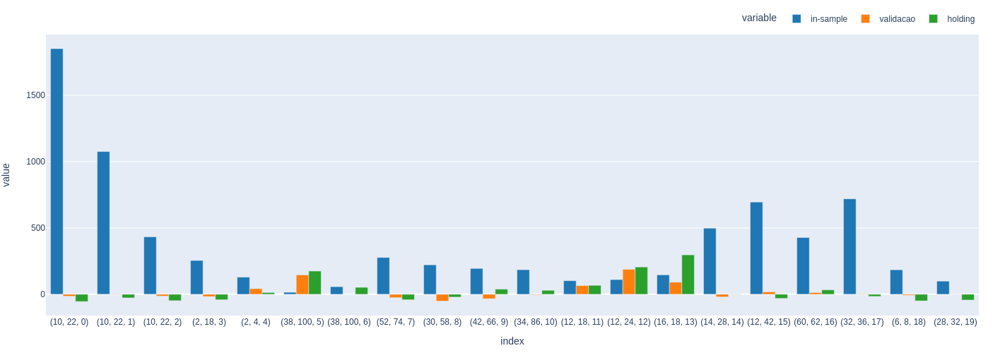

In [12]:
fig = melhores_retornos_df.vbt.px.bar(width=1000, height=500)
fig.update_layout(barmode='group')
fig.show()

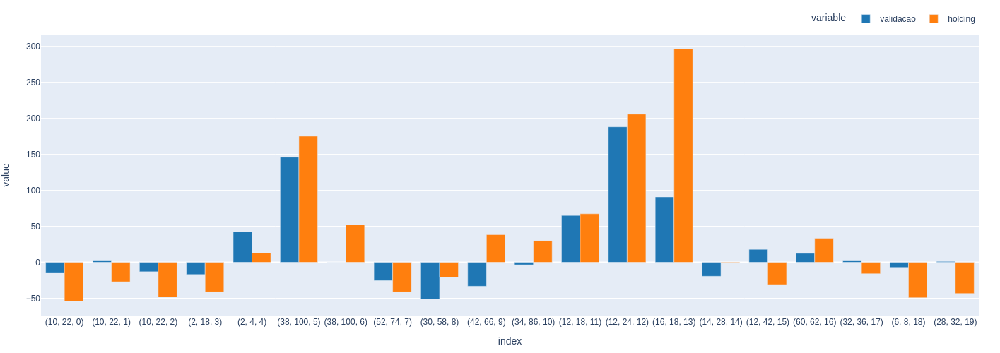

In [13]:
fig = melhores_retornos_df[['validacao', 'holding']].vbt.px.bar(width=1000, height=500)
fig.update_layout(barmode='group')
fig.show()

In [14]:
# for i in indices_melhores:
#     print('Split %s:' % i[2])
#     pf_validacao[i].orders.plot().show()

# Teste das melhores médias em todo o período

In [45]:
# set com os períodos das médias com melhor resultado
set_periodos = set([(indice[0], indice[1]) for indice in indices_melhores])
fast_w = [periodo[0] for periodo in set_periodos]
slow_w = [periodo[1] for periodo in set_periodos]

In [51]:
fast_ma_teste = vbt.MA.run(precos_buf, window=fast_w, short_name='fast')
slow_ma_teste = vbt.MA.run(precos_buf, window=slow_w, short_name='slow')

entradas_teste = fast_ma_teste.ma_crossed_above(slow_ma_teste)
saidas_teste = fast_ma_teste.ma_crossed_below(slow_ma_teste)

entradas_teste = entradas_teste[data_inicio:data_fim]
saidas_teste = saidas_teste[data_inicio:data_fim]

In [55]:
pf_teste = vbt.Portfolio.from_signals(precos, entradas_teste, saidas_teste, direction=direction)

print("Média dos resultados:")
pf_teste.stats()

Média dos resultados:


Start                           2017-01-01 00:00:00+00:00
End                             2022-08-10 00:00:00+00:00
Period                                 2048 days 00:00:00
Start Value                                        1000.0
End Value                                    41612.700617
Total Return [%]                              4061.270062
Benchmark Return [%]                          2298.782189
Max Gross Exposure [%]                              100.0
Total Fees Paid                               2693.852824
Max Drawdown [%]                                62.773626
Max Drawdown Duration         559 days 16:56:28.235294120
Total Trades                                    58.529412
Total Closed Trades                             57.823529
Total Open Trades                                0.705882
Open Trade PnL                                2675.079691
Win Rate [%]                                    47.735553
Best Trade [%]                                 236.495045
Worst Trade [%

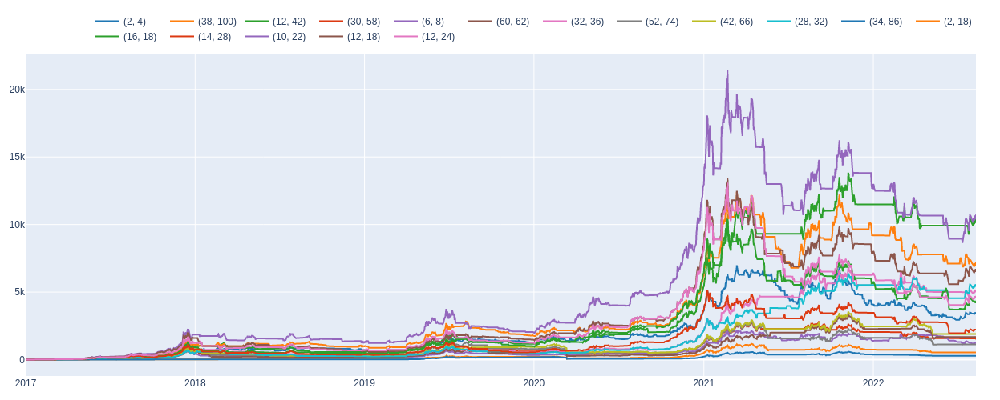

In [56]:
retorno_acumulado_teste = pf_teste.cumulative_returns() * 100
retorno_acumulado_teste.vbt.plot(width=1100, height=500).show()

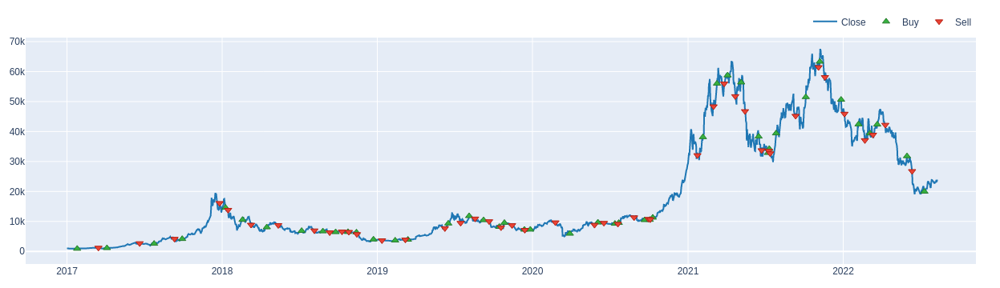

In [58]:
pf_teste[(10,22)].orders.plot().show()

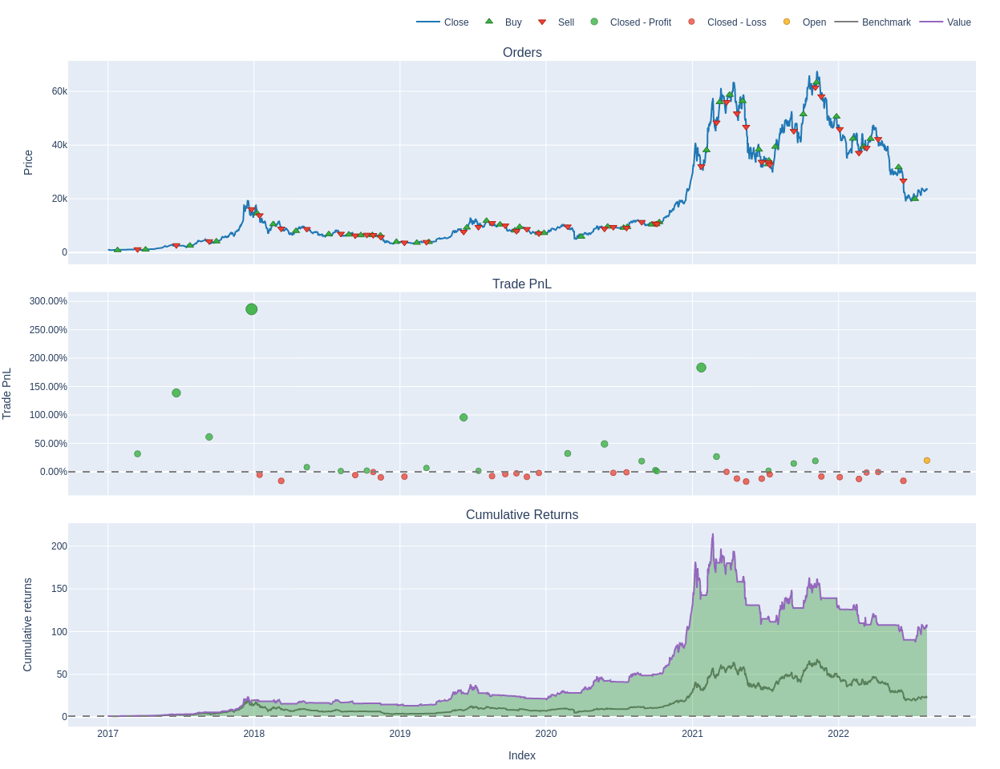

In [59]:
pf_teste[(10,22)].plot().show()

In [60]:
pf_teste.stats()

Start                           2017-01-01 00:00:00+00:00
End                             2022-08-10 00:00:00+00:00
Period                                 2048 days 00:00:00
Start Value                                        1000.0
End Value                                    41612.700617
Total Return [%]                              4061.270062
Benchmark Return [%]                          2298.782189
Max Gross Exposure [%]                              100.0
Total Fees Paid                               2693.852824
Max Drawdown [%]                                62.773626
Max Drawdown Duration         559 days 16:56:28.235294120
Total Trades                                    58.529412
Total Closed Trades                             57.823529
Total Open Trades                                0.705882
Open Trade PnL                                2675.079691
Win Rate [%]                                    47.735553
Best Trade [%]                                 236.495045
Worst Trade [%